In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/world-happiness/2015.csv
/kaggle/input/world-happiness/2017.csv
/kaggle/input/world-happiness/2019.csv
/kaggle/input/world-happiness/2018.csv
/kaggle/input/world-happiness/2016.csv


In [2]:
'''
* 2015:['Country', 'Region', 'Happiness Rank', 'Happiness Score',
       'Standard Error', 'Economy (GDP per Capita)', 'Family',
       'Health (Life Expectancy)', 'Freedom', 'Trust (Government Corruption)',
       'Generosity', 'Dystopia Residual']

* 2016: ['Country', 'Region', 'Happiness Rank', 'Happiness Score',
       'Lower Confidence Interval', 'Upper Confidence Interval',
       'Economy (GDP per Capita)', 'Family', 'Health (Life Expectancy)',
       'Freedom', 'Trust (Government Corruption)', 'Generosity',
       'Dystopia Residual']

* 2017: ['Country', 'Happiness.Rank', 'Happiness.Score', 'Whisker.high',
       'Whisker.low', 'Economy..GDP.per.Capita.', 'Family',
       'Health..Life.Expectancy.', 'Freedom', 'Generosity',
       'Trust..Government.Corruption.', 'Dystopia.Residual']

* 2018: ['Overall rank', 'Country or region', 'Score', 'c',
       'Social support', 'Healthy life expectancy',
       'Freedom to make life choices', 'Generosity',
       'Perceptions of corruption']

* 2019: ['Overall rank', 'Country or region', 'Score', 'GDP per capita',
       'Social support', 'Healthy life expectancy',
       'Freedom to make life choices', 'Generosity',
       'Perceptions of corruption']


- Country hepsinde var. Region sil Country kalsın
- 2018-2019 overal rank = happiness rank
- 18-19 score = happiness score
- 15 standart error kaldır
- Economy (GDP per Capita) = GDP per capita
- 18 ve 19 da family yok onun yerine social support var
- Health (Life Expectancy) = Healthy life expectancy
- Freedom = Freedom to make life choices
- Trust (Government Corruption) = Perceptions of corruption
- Dystopia Residual 17 18 19 dda yok
'''


"\n* 2015:['Country', 'Region', 'Happiness Rank', 'Happiness Score',\n       'Standard Error', 'Economy (GDP per Capita)', 'Family',\n       'Health (Life Expectancy)', 'Freedom', 'Trust (Government Corruption)',\n       'Generosity', 'Dystopia Residual']\n\n* 2016: ['Country', 'Region', 'Happiness Rank', 'Happiness Score',\n       'Lower Confidence Interval', 'Upper Confidence Interval',\n       'Economy (GDP per Capita)', 'Family', 'Health (Life Expectancy)',\n       'Freedom', 'Trust (Government Corruption)', 'Generosity',\n       'Dystopia Residual']\n\n* 2017: ['Country', 'Happiness.Rank', 'Happiness.Score', 'Whisker.high',\n       'Whisker.low', 'Economy..GDP.per.Capita.', 'Family',\n       'Health..Life.Expectancy.', 'Freedom', 'Generosity',\n       'Trust..Government.Corruption.', 'Dystopia.Residual']\n\n* 2018: ['Overall rank', 'Country or region', 'Score', 'c',\n       'Social support', 'Healthy life expectancy',\n       'Freedom to make life choices', 'Generosity',\n       '

In [3]:
import plotly as py
import plotly.graph_objects as go
from plotly.offline import plot
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import unicodedata
import plotly.express as px
import warnings
# Uyarıları gizleme
warnings.filterwarnings("ignore", category=FutureWarning)
import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

import plotly.offline as pyo
import plotly.graph_objs as go
# Set notebook mode to work in offline
pyo.init_notebook_mode()

/kaggle/input/world-happiness/2015.csv
/kaggle/input/world-happiness/2017.csv
/kaggle/input/world-happiness/2019.csv
/kaggle/input/world-happiness/2018.csv
/kaggle/input/world-happiness/2016.csv


In [4]:
data1=pd.read_csv('/kaggle/input/world-happiness/2015.csv')
data2=pd.read_csv('/kaggle/input/world-happiness/2016.csv')
data3=pd.read_csv('/kaggle/input/world-happiness/2017.csv')
data4=pd.read_csv('/kaggle/input/world-happiness/2018.csv')
data5=pd.read_csv('/kaggle/input/world-happiness/2019.csv')

**2015 verileri için**

In [5]:
# Dosya adından yılı almak ve yeni sütun olarak eklemek
data1['Year'] = int("2015")

# Region sütunlarını düşürebiliriz
data1.drop(['Region'], axis=1, inplace=True)
data1.rename(columns = {
    "Economy (GDP per Capita)" : "Economy",
    "Health (Life Expectancy)" : "Health",
    "Trust (Government Corruption)" : "Government Corruption",
    "Country or Region" : "Country"
    }, inplace = True)
data1.head()

,Country,Happiness Rank,Happiness Score,Standard Error,Economy,Family,Health,Freedom,Government Corruption,Generosity,Dystopia Residual,Year
0,Switzerland,1,7.587,0.03411,1.39651,1.34951,0.94143,0.66557,0.41978,0.29678,2.51738,2015
1,Iceland,2,7.561,0.04884,1.30232,1.40223,0.94784,0.62877,0.14145,0.43630,2.70201,2015
2,Denmark,3,7.527,0.03328,1.32548,1.36058,0.87464,0.64938,0.48357,0.34139,2.49204,2015
3,Norway,4,7.522,0.03880,1.45900,1.33095,0.88521,0.66973,0.36503,0.34699,2.46531,2015
4,Canada,5,7.427,0.03553,1.32629,1.32261,0.90563,0.63297,0.32957,0.45811,2.45176,2015


In [6]:
# Eksik verileri kontrol et
data1_non = data1.isnull().sum()
print(data1_non)

Country                  0
Happiness Rank           0
Happiness Score          0
Standard Error           0
Economy                  0
Family                   0
Health                   0
Freedom                  0
Government Corruption    0
Generosity               0
Dystopia Residual        0
Year                     0
dtype: int64


**2016 verileri için**

In [7]:
data2['Year'] = int("2016")

data2.rename(columns = {
    "Economy (GDP per Capita)" : "Economy",
    "Health (Life Expectancy)" : "Health",
    "Trust (Government Corruption)" : "Government Corruption"
    }, inplace = True)

#Region sütunlarını düşürebiliriz
data2.drop(['Region'], axis=1, inplace=True)

In [8]:
# Eksik verileri kontrol et
data2_non = data2.isnull().sum()
print(data2_non)

Country                      0
Happiness Rank               0
Happiness Score              0
Lower Confidence Interval    0
Upper Confidence Interval    0
Economy                      0
Family                       0
Health                       0
Freedom                      0
Government Corruption        0
Generosity                   0
Dystopia Residual            0
Year                         0
dtype: int64


**2017 verileri için**

In [9]:
data3['Year'] = int("2017")

data3.rename(columns = {
    "Happiness.Rank" : "Happiness Rank",
    "Happiness.Score" : "Happiness Score",
    "Whisker.high" : "Whisker high",
    "Whisker.low" : "Whisker low",
    "Economy..GDP.per.Capita." : "Economy",
    "Health..Life.Expectancy." : "Health",
    "Trust..Government.Corruption." : "Government Corruption",
    "Dystopia.Residual" : "Dystopia Residual"
    }, inplace = True)
data3.head()

,Country,Happiness Rank,Happiness Score,Whisker high,Whisker low,Economy,Family,Health,Freedom,Generosity,Government Corruption,Dystopia Residual,Year
0,Norway,1,7.537,7.594445,7.479556,1.616463,1.533524,0.796667,0.635423,0.362012,0.315964,2.277027,2017
1,Denmark,2,7.522,7.581728,7.462272,1.482383,1.551122,0.792566,0.626007,0.355280,0.400770,2.313707,2017
2,Iceland,3,7.504,7.622030,7.385970,1.480633,1.610574,0.833552,0.627163,0.475540,0.153527,2.322715,2017
3,Switzerland,4,7.494,7.561772,7.426227,1.564980,1.516912,0.858131,0.620071,0.290549,0.367007,2.276716,2017
4,Finland,5,7.469,7.527542,7.410458,1.443572,1.540247,0.809158,0.617951,0.245483,0.382612,2.430182,2017


In [10]:
# Eksik verileri kontrol et
data3_non = data3.isnull().sum()
print(data3_non)

Country                  0
Happiness Rank           0
Happiness Score          0
Whisker high             0
Whisker low              0
Economy                  0
Family                   0
Health                   0
Freedom                  0
Generosity               0
Government Corruption    0
Dystopia Residual        0
Year                     0
dtype: int64


**2018 verileri için**

In [11]:
data4['Year'] = int("2018")

data4.rename(columns = {
    "Overall rank" : "Happiness Rank",
    "Score" : "Happiness Score",
    "GDP per capita" : "Economy",
    "Country or region" : "Country",
    "Healthy life expectancy" : "Health",
    "Freedom to make life choices" : "Freedom",
    "Perceptions of corruption" : "Government Corruption"
    }, inplace = True)

data4.head()

,Happiness Rank,Country,Happiness Score,Economy,Social support,Health,Freedom,Generosity,Government Corruption,Year
0,1,Finland,7.632,1.305,1.592,0.874,0.681,0.202,0.393,2018
1,2,Norway,7.594,1.456,1.582,0.861,0.686,0.286,0.340,2018
2,3,Denmark,7.555,1.351,1.590,0.868,0.683,0.284,0.408,2018
3,4,Iceland,7.495,1.343,1.644,0.914,0.677,0.353,0.138,2018
4,5,Switzerland,7.487,1.420,1.549,0.927,0.660,0.256,0.357,2018


In [12]:
# Eksik verileri kontrol et
data4_non = data4.isnull().sum()
print(data4_non)

Happiness Rank           0
Country                  0
Happiness Score          0
Economy                  0
Social support           0
Health                   0
Freedom                  0
Generosity               0
Government Corruption    1
Year                     0
dtype: int64


In [13]:
# Sayısal sütunlarda boş değerleri ortalama ile doldurmak
data4['Government Corruption'] = data4['Government Corruption'].fillna(data4['Government Corruption'].mean())
data4_nan = data4.isnull().sum()
print(data4_nan)

Happiness Rank           0
Country                  0
Happiness Score          0
Economy                  0
Social support           0
Health                   0
Freedom                  0
Generosity               0
Government Corruption    0
Year                     0
dtype: int64


**2019 yılı için**

In [14]:
data5['Year'] = int("2019")

data5.rename(columns = {
    "Overall rank" : "Happiness Rank",
    "Score" : "Happiness Score",
    "GDP per capita" : "Economy",
    "Country or region" : "Country",
    "Healthy life expectancy" : "Health",
    "Freedom to make life choices" : "Freedom",
    "Perceptions of corruption" : "Government Corruption"
    }, inplace = True)

data5.head()

,Happiness Rank,Country,Happiness Score,Economy,Social support,Health,Freedom,Generosity,Government Corruption,Year
0,1,Finland,7.769,1.340,1.587,0.986,0.596,0.153,0.393,2019
1,2,Denmark,7.600,1.383,1.573,0.996,0.592,0.252,0.410,2019
2,3,Norway,7.554,1.488,1.582,1.028,0.603,0.271,0.341,2019
3,4,Iceland,7.494,1.380,1.624,1.026,0.591,0.354,0.118,2019
4,5,Netherlands,7.488,1.396,1.522,0.999,0.557,0.322,0.298,2019


In [15]:
# Eksik verileri kontrol et
data5_non = data5.isnull().sum()
print(data5_non)

Happiness Rank           0
Country                  0
Happiness Score          0
Economy                  0
Social support           0
Health                   0
Freedom                  0
Generosity               0
Government Corruption    0
Year                     0
dtype: int64


In [16]:
merged_data=pd.concat([data1, data2, data3, data4, data5], axis = 0)
columns_data = merged_data.columns
print(columns_data)

Index(['Country', 'Happiness Rank', 'Happiness Score', 'Standard Error',
       'Economy', 'Family', 'Health', 'Freedom', 'Government Corruption',
       'Generosity', 'Dystopia Residual', 'Year', 'Lower Confidence Interval',
       'Upper Confidence Interval', 'Whisker high', 'Whisker low',
       'Social support'],
      dtype='object')


In [17]:
merged_data.drop(['Standard Error', 
                  'Dystopia Residual', 
                  'Lower Confidence Interval', 
                  'Upper Confidence Interval',
                  'Whisker high', 
                  'Whisker low', 
                  'Social support', 
                  'Family'], axis=1, inplace=True)
new_columns_data = merged_data.columns

In [18]:
described=merged_data.describe()
print(described)

       Happiness Rank  Happiness Score     Economy      Health     Freedom  \
count      782.000000       782.000000  782.000000  782.000000  782.000000   
mean        78.698210         5.379018    0.916047    0.612416    0.411091   
std         45.182384         1.127456    0.407340    0.248309    0.152880   
min          1.000000         2.693000    0.000000    0.000000    0.000000   
25%         40.000000         4.509750    0.606500    0.440183    0.309768   
50%         79.000000         5.322000    0.982205    0.647310    0.431000   
75%        118.000000         6.189500    1.236187    0.808000    0.531000   
max        158.000000         7.769000    2.096000    1.141000    0.724000   

       Government Corruption  Generosity         Year  
count             782.000000  782.000000   782.000000  
mean                0.125418    0.218576  2016.993606  
std                 0.105750    0.122321     1.417364  
min                 0.000000    0.000000  2015.000000  
25%              

In [19]:
merged_data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 782 entries, 0 to 155
Data columns (total 9 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   Country                782 non-null    object 
 1   Happiness Rank         782 non-null    int64  
 2   Happiness Score        782 non-null    float64
 3   Economy                782 non-null    float64
 4   Health                 782 non-null    float64
 5   Freedom                782 non-null    float64
 6   Government Corruption  782 non-null    float64
 7   Generosity             782 non-null    float64
 8   Year                   782 non-null    int64  
dtypes: float64(6), int64(2), object(1)
memory usage: 61.1+ KB


In [20]:
yedek_merged = merged_data

# Eksik verileri kontrol et
missing_data = merged_data.isnull().sum()
print(missing_data)

Country                  0
Happiness Rank           0
Happiness Score          0
Economy                  0
Health                   0
Freedom                  0
Government Corruption    0
Generosity               0
Year                     0
dtype: int64


In [21]:
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns

# %% İki Değişkenl analiz

numeric_correlation = merged_data.loc[:, ["Happiness Score", "Economy", "Freedom", "Health", "Generosity", "Government Corruption"]].corr() 
print(numeric_correlation)
# Mululuk skoru ile en ilişkili olan özellilkler 1- Ekonomi, 2- Health, 3-Freedom


                       Happiness Score   Economy   Freedom    Health  \
Happiness Score               1.000000  0.789284  0.551258  0.742456   
Economy                       0.789284  1.000000  0.340511  0.784338   
Freedom                       0.551258  0.340511  1.000000  0.340745   
Health                        0.742456  0.784338  0.340745  1.000000   
Generosity                    0.137578 -0.014560  0.290706  0.010638   
Government Corruption         0.397821  0.304181  0.459520  0.250463   

                       Generosity  Government Corruption  
Happiness Score          0.137578               0.397821  
Economy                 -0.014560               0.304181  
Freedom                  0.290706               0.459520  
Health                   0.010638               0.250463  
Generosity               1.000000               0.318945  
Government Corruption    0.318945               1.000000  


In [22]:
# ülkelerdeki sağlık, ekonomi ve özgürlüklere göre mutluluk skoru 
# groupby
# Country bazında gruplama ve ortalama hesaplama
groupby_Country = merged_data[["Country", "Happiness Score", "Economy", "Freedom", "Health"]].groupby("Country", as_index=False).mean()
# Happiness Score'a göre sıralama
groupby_Country_sorted = groupby_Country.sort_values(by="Happiness Score", ascending=False)
# İlk 20 ülkeyi seçme
groupby_Country_sorted_10 = groupby_Country_sorted.head(10)
# Sonuçları görüntüleme
print(groupby_Country_sorted_10)

         Country  Happiness Score   Economy   Freedom    Health
38       Denmark           7.5460  1.396729  0.625959  0.865249
111       Norway           7.5410  1.519381  0.638049  0.873333
46       Finland           7.5378  1.356960  0.621536  0.873836
145  Switzerland           7.5114  1.472164  0.620642  0.928318
61       Iceland           7.5110  1.386523  0.618035  0.917744
103  Netherlands           7.4046  1.411013  0.589651  0.878569
25        Canada           7.3506  1.388129  0.610954  0.900558
144       Sweden           7.3192  1.403981  0.617581  0.898991
104  New Zealand           7.3130  1.317509  0.617782  0.891618
6      Australia           7.2762  1.394885  0.605043  0.914529


In [23]:
turkey = groupby_Country.query("Country == 'Turkey'")  # Sadece Türkiye'yi filtrele
print(turkey)

    Country  Happiness Score   Economy   Freedom    Health
156  Turkey           5.4154  1.151035  0.257356  0.702101


In [24]:
# ülkelere göre yolsuzluk oranları
groupby_government = merged_data[["Country", "Government Corruption"]].groupby("Country", as_index=False).mean()
groupby_government_sorted = groupby_government.sort_values(by="Government Corruption", ascending=False)
print(groupby_government_sorted)

                    Country  Government Corruption
125                  Rwanda               0.473468
130               Singapore               0.467256
38                  Denmark               0.429374
104             New Zealand               0.400015
135       Somaliland region               0.399280
..                      ...                    ...
154     Trinidad and Tobago               0.010925
95                  Moldova               0.009054
20                 Bulgaria               0.007784
123                 Romania               0.004734
17   Bosnia and Herzegovina               0.001654

[170 rows x 2 columns]


In [25]:
# %% cok degiskenli veri analizi
# pivot table

# Mutluluk skoruna göre sağlık, ekonomi, özgürlüğe bakalım

data_pivot = merged_data.pivot_table(
    index="Country",
    values=["Economy", "Freedom", "Health"],
    aggfunc={
        "Economy": ["mean", "max", "min"],
        "Freedom": ["mean", "max", "min"],
        "Health": ["mean", "max", "min"]
    }
)

print(data_pivot)


              Economy                     Freedom                    Health  \
                  max      mean      min      max      mean      min    max   
Country                                                                       
Afghanistan  0.401477  0.357113  0.31982  0.23414  0.117924  0.00000  0.361   
Albania      0.996193  0.938633  0.87867  0.41900  0.371898  0.31866  0.874   
Algeria      1.091864  1.012963  0.93929  0.28579  0.178437  0.07700  0.785   
Angola       0.858428  0.798380  0.73000  0.10384  0.027433  0.00000  0.269   
Argentina    1.185295  1.111035  1.05351  0.57000  0.481620  0.42284  0.881   
...               ...       ...      ...      ...       ...      ...    ...   
Venezuela    1.133670  1.052468  0.96000  0.42908  0.213709  0.13300  0.805   
Vietnam      0.788548  0.723416  0.63216  0.61800  0.577207  0.54300  0.851   
Yemen        0.591683  0.489313  0.28700  0.35571  0.244175  0.14300  0.463   
Zambia       0.636407  0.571761  0.47038  0.50300  0

In [26]:
merged_data.head()

,Country,Happiness Rank,Happiness Score,Economy,Health,Freedom,Government Corruption,Generosity,Year
0,Switzerland,1,7.587,1.39651,0.94143,0.66557,0.41978,0.29678,2015
1,Iceland,2,7.561,1.30232,0.94784,0.62877,0.14145,0.43630,2015
2,Denmark,3,7.527,1.32548,0.87464,0.64938,0.48357,0.34139,2015
3,Norway,4,7.522,1.45900,0.88521,0.66973,0.36503,0.34699,2015
4,Canada,5,7.427,1.32629,0.90563,0.63297,0.32957,0.45811,2015


In [27]:
data_pivot2 = merged_data.pivot_table(
    index="Country",
    values=["Economy", "Freedom", "Health", "Year", "Generosity", "Government Corruption"],
    aggfunc={"Economy": ["mean", "max", "min"], 
             "Freedom": ["mean", "max", "min"],
             "Health": ["mean", "max", "min"],
             "Year" : ["max", "min"], 
             "Generosity" : ["mean", "max", "min"], 
             "Government Corruption" : ["mean", "max", "min"]}
)

print(data_pivot2)

              Economy                     Freedom                     \
                  max      mean      min      max      mean      min   
Country                                                                
Afghanistan  0.401477  0.357113  0.31982  0.23414  0.117924  0.00000   
Albania      0.996193  0.938633  0.87867  0.41900  0.371898  0.31866   
Algeria      1.091864  1.012963  0.93929  0.28579  0.178437  0.07700   
Angola       0.858428  0.798380  0.73000  0.10384  0.027433  0.00000   
Argentina    1.185295  1.111035  1.05351  0.57000  0.481620  0.42284   
...               ...       ...      ...      ...       ...      ...   
Venezuela    1.133670  1.052468  0.96000  0.42908  0.213709  0.13300   
Vietnam      0.788548  0.723416  0.63216  0.61800  0.577207  0.54300   
Yemen        0.591683  0.489313  0.28700  0.35571  0.244175  0.14300   
Zambia       0.636407  0.571761  0.47038  0.50300  0.462099  0.42662   
Zimbabwe     0.375847  0.344051  0.27100  0.40600  0.323257  0.2

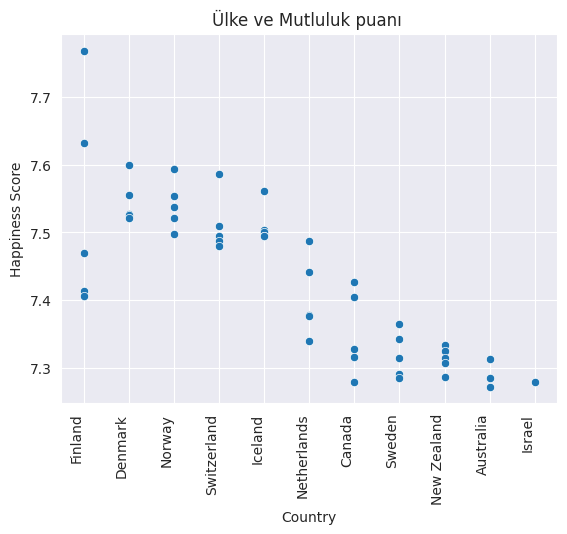

In [28]:
# country ve harrpiest score
# Mutluluk skoruna göre ilk 50 ülkeyi seçme
top_50 = merged_data.sort_values(by="Happiness Score", ascending=False).head(50)

sns.set_style("darkgrid")
plt.figure()
sns.scatterplot(x = "Country", y = "Happiness Score", data = top_50)
plt.title("Ülke ve Mutluluk puanı ")
plt.xticks(rotation=90, ha='right')

plt.show()

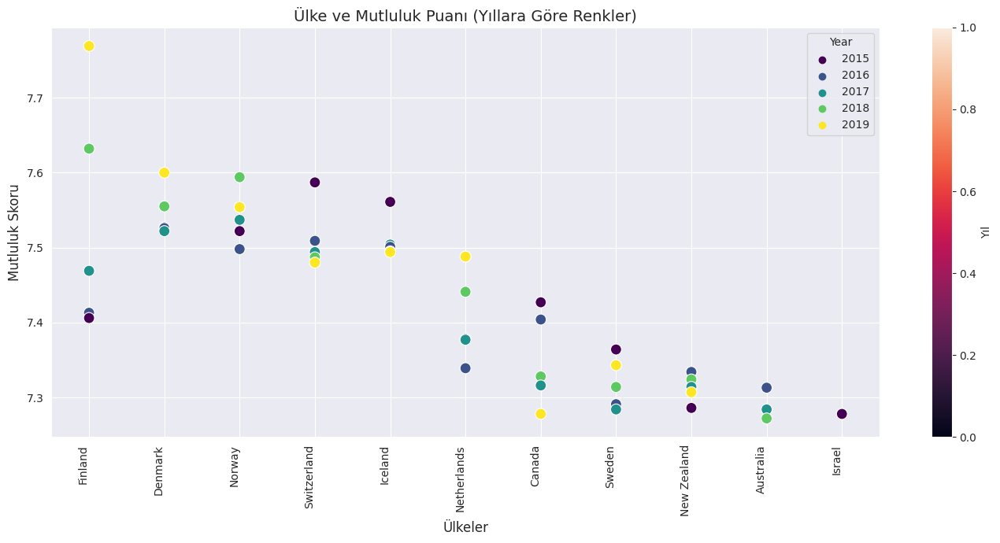

In [29]:
# Grafik
sns.set_style("darkgrid")
plt.figure(figsize=(14, 7))

# Scatterplot çizimi
scatter = sns.scatterplot(
    x="Country", 
    y="Happiness Score", 
    hue="Year",  # Yıllara göre renkler
    palette="viridis",  # Renk paleti
    data=top_50,
    s=100  # Nokta boyutu
)

# Başlık ve etiketler
plt.title("Ülke ve Mutluluk Puanı (Yıllara Göre Renkler)", fontsize=14)
plt.xlabel("Ülkeler", fontsize=12)
plt.ylabel("Mutluluk Skoru", fontsize=12)
plt.xticks(rotation=90, ha='right')  # Ülke isimlerini döndür

# Colorbar eklemek için scatter nesnesinin `collections` özelliğini kullanıyoruz
plt.colorbar(scatter.collections[0], label="Yıl")  # Renk açıklaması için

plt.tight_layout()  # Sıkışıklığı önler
plt.show()


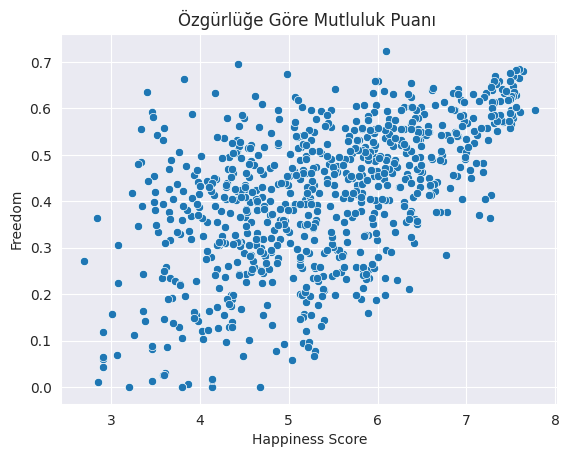

In [30]:
#mutluluk ve özgürlük
sns.set_style("darkgrid")
plt.figure()
sns.scatterplot(x = "Happiness Score", y = "Freedom", data = merged_data)
plt.title("Özgürlüğe Göre Mutluluk Puanı ")

plt.show()


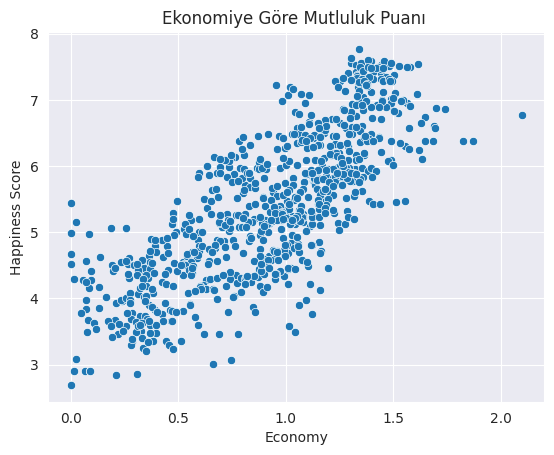

In [31]:
#mutluluk ve ekonomi
sns.set_style("darkgrid")
plt.figure()
sns.scatterplot(x = "Economy", y = "Happiness Score", data = merged_data)
plt.title("Ekonomiye Göre Mutluluk Puanı ")

plt.show()

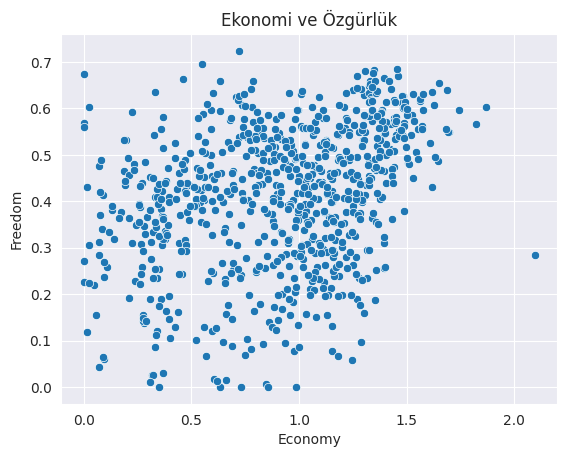

In [32]:
#ekonomi ve özgürlük
sns.set_style("darkgrid")
plt.figure()
sns.scatterplot(x = "Economy", y = "Freedom", data = merged_data)
plt.title("Ekonomi ve Özgürlük")

plt.show()

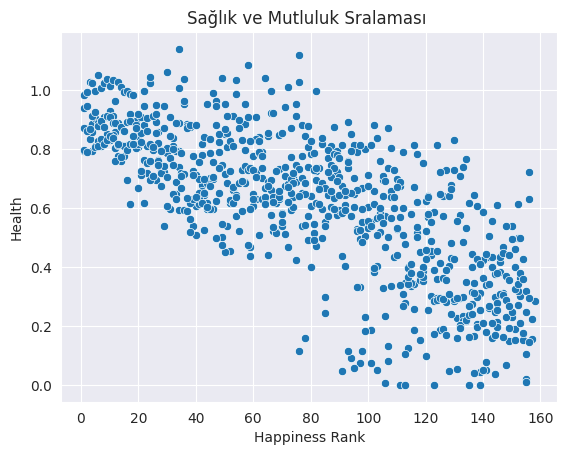

In [33]:
#sağlk ve mutluluk
sns.set_style("darkgrid")
plt.figure()
sns.scatterplot(x = "Happiness Rank", y = "Health", data = merged_data)
plt.title("Sağlık ve Mutluluk Sralaması ")

plt.show()

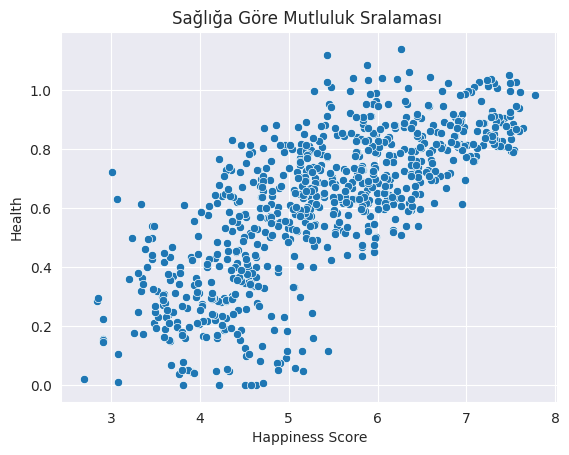

In [34]:
#sağlk ve mutluluk
sns.set_style("darkgrid")
plt.figure()
sns.scatterplot(x = "Happiness Score", y = "Health", data = merged_data)
plt.title("Sağlığa Göre Mutluluk Sralaması ")

plt.show()

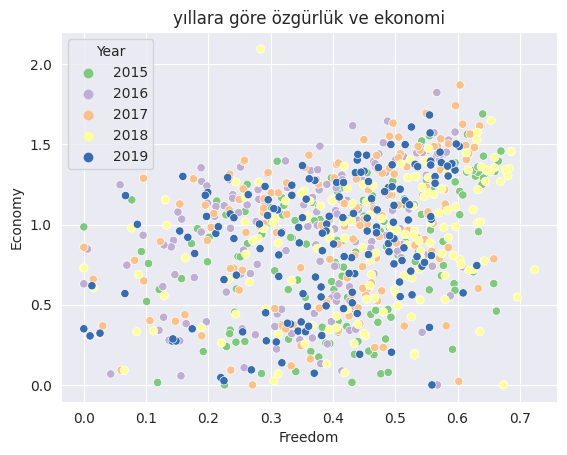

In [35]:
# yıllara göre özgürlük ve ekonomi
plt.figure()
sns.scatterplot(x='Freedom', y='Economy', data=merged_data ,hue="Year" , palette="Accent")
plt.title('yıllara göre özgürlük ve ekonomi')
plt.show()

<Figure size 640x480 with 0 Axes>

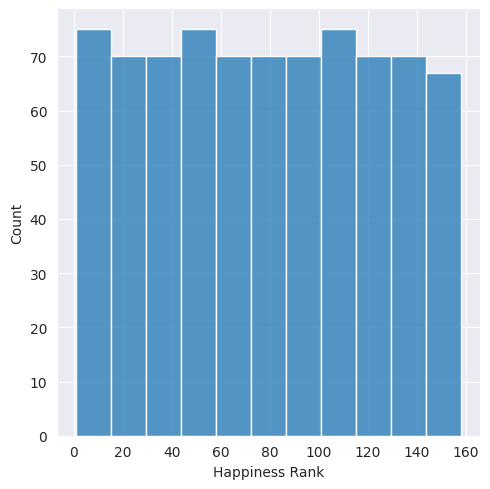

<Figure size 640x480 with 0 Axes>

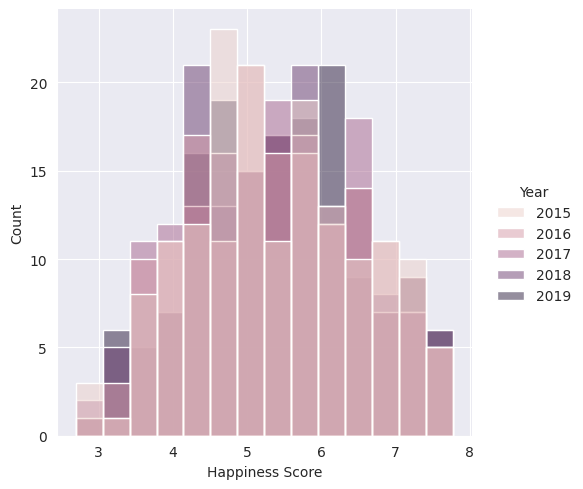

<Figure size 640x480 with 0 Axes>

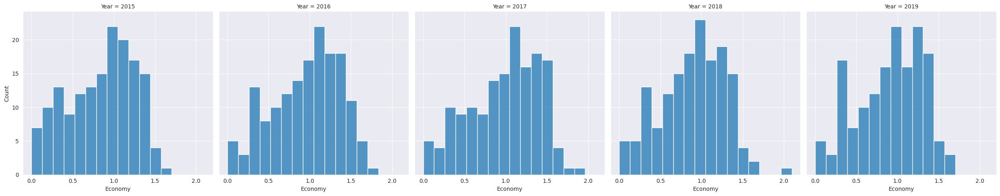

<Figure size 640x480 with 0 Axes>

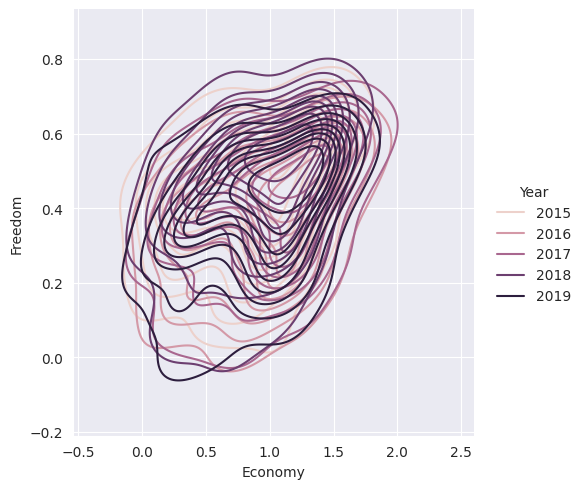

<Figure size 640x480 with 0 Axes>

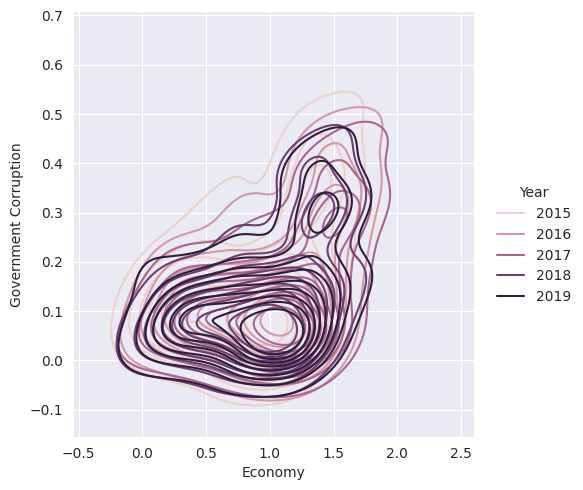

In [36]:
# %% histogram
plt.figure() 
sns.displot(merged_data, x = "Happiness Rank")

plt.figure() 
sns.displot(merged_data, x = "Happiness Score", hue = "Year")

plt.figure()
sns.displot(merged_data, x = "Economy", col = "Year")

# iki boyutlu histogram
plt.figure()
sns.displot(merged_data, x = "Economy", y = "Freedom", kind = "kde", hue = "Year")

plt.figure()
sns.displot(merged_data, x = "Economy", y = "Government Corruption", kind = "kde", hue = "Year")

plt.show()

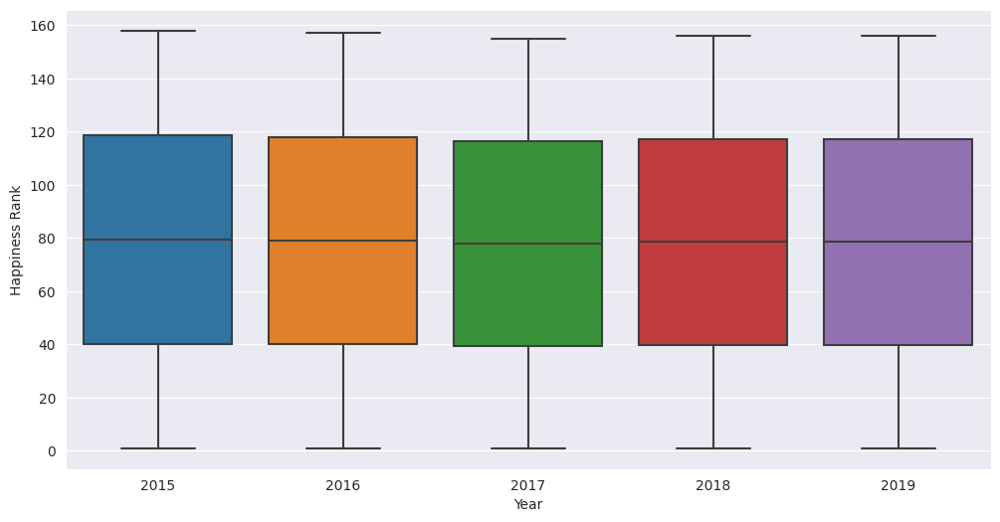

In [37]:
# %% box plot 
plt.figure(figsize=(12, 6))  # Görsel boyutlarını ayarla
sns.boxplot(x="Year", y="Happiness Rank", data=merged_data)
plt.show()

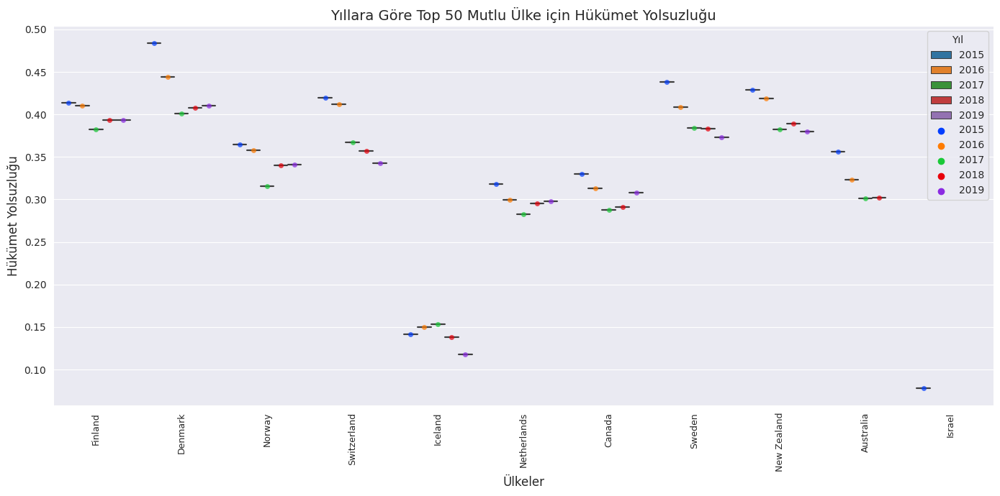

In [38]:
top_50_by_year = merged_data.sort_values(by=["Year", "Happiness Rank"], ascending=[True, True]).groupby("Year").head(50)

plt.figure(figsize=(14, 7))

# Boxplot (hue = "Year")
sns.boxplot(x="Country", y="Government Corruption", data=top_50, hue="Year")

# Stripplot (aynı veriyi kullanarak, aynı 'hue' ayarını ekleriz)
sns.stripplot(x="Country", y="Government Corruption", data=top_50, hue="Year", 
              dodge=True, palette="bright", jitter=True, alpha=0.7)

plt.xticks(rotation=90, ha='center', fontsize=9)
plt.title("Yıllara Göre Top 50 Mutlu Ülke için Hükümet Yolsuzluğu", fontsize=14)
plt.xlabel("Ülkeler", fontsize=12)
plt.ylabel("Hükümet Yolsuzluğu", fontsize=12)
plt.legend(title="Yıl", fontsize=10)
plt.tight_layout()
plt.show()



In [39]:
import plotly.express as px
import plotly.io as pio

# Render ayarı
pio.renderers.default = 'notebook'

# Kutu grafiği
fig = px.box(
    top_50,
    x="Country",
    y="Government Corruption",
    color="Year",
    points="all",  # Veri noktalarını göster
    title="Yıllara Göre Top 50 Mutlu Ülke için Hükümet Yolsuzluğu",
    labels={"Government Corruption": "Hükümet Yolsuzluğu", "Country": "Ülkeler"},
    width=1000,
    height=600
)

fig.update_layout(
    xaxis=dict(tickangle=90),
    legend_title="Yıl",
    font=dict(size=12)
)

fig.show()
fig.write_html("graph.html")  # Grafiği HTML olarak kaydet
print("Graph saved as 'graph.html'. You can download and open it locally.")


Graph saved as 'graph.html'. You can download and open it locally.


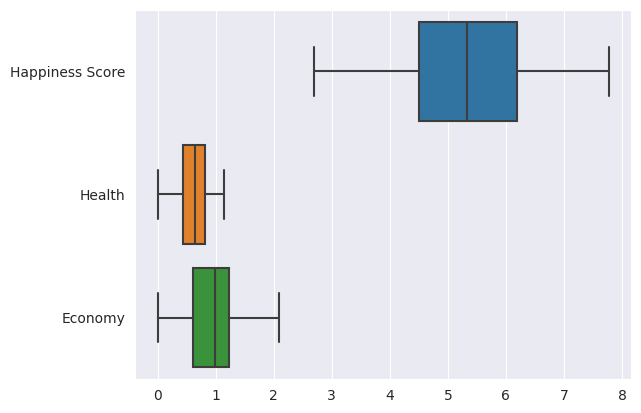

In [40]:
plt.figure()
veri_gecici = merged_data.loc[:, ["Happiness Score", "Health", "Economy"]]
sns.boxplot( data = veri_gecici, orient="h")
plt.show()

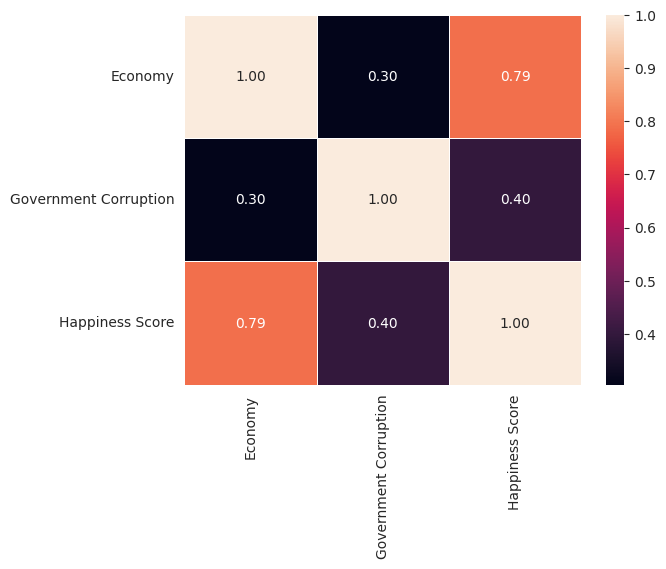

In [41]:
# %% heat map
veri_gecici = merged_data.loc[:, ["Economy", "Government Corruption", "Happiness Score"]]
correlation = veri_gecici.corr()

sns.heatmap(correlation, annot = True, fmt = ".2f", linewidths=0.5)

plt.show()